# 1.この課題の目的
データセットを作成し学習する
データ拡張を行う
以下の要件をすべて満たしていた場合、合格とします。

※Jupyter Notebookを使い課題に沿った検証や説明ができている。

# 2.自作データセットの学習
自作のデータセットに対して分類および物体検出を行っていきます。具体的なタスクは講師からの指示に従ってください。

# 【問題1】自作データセットでの分類の学習
自作のデータセットに対して分類問題を解いてください。任意の実装を使用してください。
## 確認結果
### 以下の画像20枚の画像を用いて分類精度→67%

## 使用するクラスをインポート

In [1]:
import keras
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers.convolutional import Conv2D, MaxPooling2D
from keras.layers.core import Dense, Dropout, Activation, Flatten
import numpy as np
from sklearn.model_selection import train_test_split
from PIL import Image
from IPython.display import display
import glob
import os
import cv2
import matplotlib.pyplot as plt
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array, array_to_img

Using TensorFlow backend.


## データセットを用意
- 犬と猫のjpeg画像がそれぞれ10枚ずつのデータセット
- 解像度、アスペクト比は指定なし

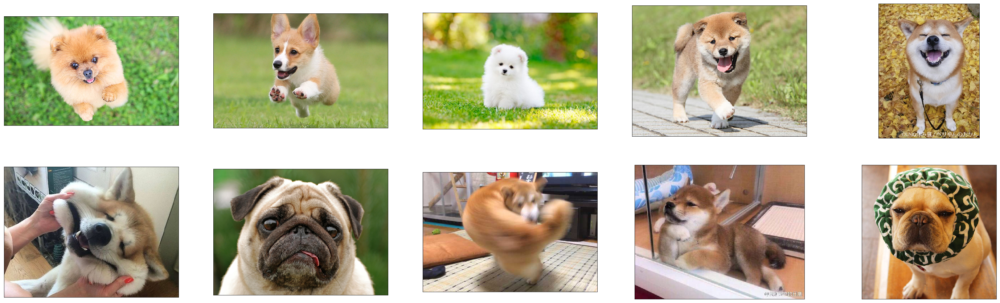

In [49]:
fig = plt.figure(figsize=(50,15))
for i in range(1, 11):
    fig.add_subplot(2, 5, i)
    img = plt.imread('./photo/dog/dog' + str(i) + '.jpg')
    plt.tick_params(labelbottom=False, labelleft=False)
    plt.tick_params(bottom=False, left=False)
    plt.imshow(img)
plt.show()

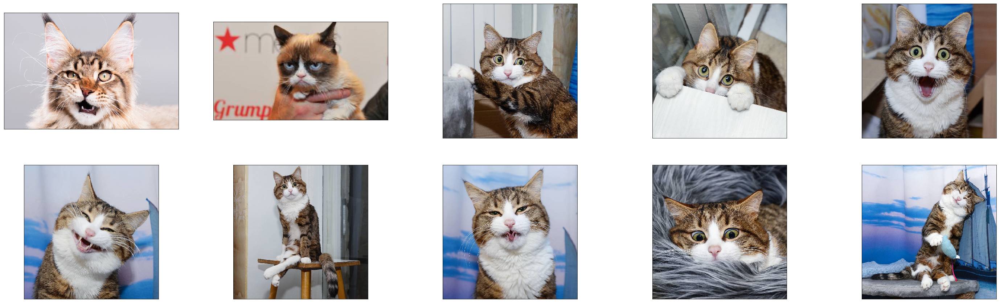

In [50]:
fig = plt.figure(figsize=(50,15))
for i in range(1, 11):
    fig.add_subplot(2, 5, i)
    img = plt.imread('./photo/cat/cat' + str(i) + '.jpg')
    plt.tick_params(labelbottom=False, labelleft=False)
    plt.tick_params(bottom=False, left=False)
    plt.imshow(img)
plt.show()

## preproメソッド(データの前処理を実施)

In [5]:
def prepro(folder, image_size, image_folder):
    
    # numpy配列化した画像データを格納するリスト
    X = []
    # 各画像の正解データ
    Y = []

    # カレントディレクトを画像が格納されてあるフォルダに変更
    os.chdir(image_folder)

    # folderリストの中のデータを順に取り出しnameに格納し、indexに0,1,2,3・・・と格納
    for index, name in enumerate(folder):
        dir = "./" + name
        files = glob.glob(dir + "/*.jpg")
        for i, file in enumerate(files):
            image = Image.open(file)
            image = image.convert("RGB")
            image = image.resize((image_size, image_size))
            data = np.asarray(image)
            X.append(data)
            Y.append(index)

    X = np.array(X)
    Y = np.array(Y)
    
    X = X.astype('float32')
    X = X / 255.0
    
    # 正解ラベルの形式を変換
    Y = np_utils.to_categorical(Y, 2)

    return X, Y

## 前処理

In [6]:
folder = ["cat","dog"]
image_size = 100
image_folder = '/Users/takahiro/Desktop/DiveIntoCode_session/sprint19/photo'

X, Y = prepro(folder, image_size, image_folder)

In [7]:
# 学習用データとテストデータ
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20)

## モデル作成・学習

In [8]:
# CNNを構築
model = Sequential()
 
model.add(Conv2D(32, (3, 3), padding='same',input_shape=X_train.shape[1:]))
model.add(Activation('relu'))
model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
 
model.add(Conv2D(64, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
 
model.add(Flatten())
model.add(Dense(512))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(2))
model.add(Activation('softmax'))
 
# コンパイル
model.compile(loss='categorical_crossentropy',optimizer='SGD',metrics=['accuracy'])

#訓練
history = model.fit(X_train, y_train, batch_size=16,epochs=10)

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Use tf.cast instead.
Epoch 1/10
16/16 [==============================] - 1s 65ms/step - loss: 0.6980 - acc: 0.4375
Epoch 2/10
16/16 [==============================] - 1s 37ms/step - loss: 0.7034 - acc: 0.3750
Epoch 3/10
16/16 [==============================] - 1s 35ms/step - loss: 0.7093 - acc: 0.5000
Epoch 4/10
16/16 [==============================] - 1s 37ms/step - loss: 0.6981 - acc: 0.5000
Epoch 5/10
16/16 [==============================] - 1s 39ms/step - loss: 0.7041 - acc: 0.5000
Epoch 6/10
16/16 [==============================] - 1s 37ms/step - loss: 0.6905 - acc: 0.6875
Epoch 7/10
16/16 [==============================] - 1s 39ms/step - loss: 0.6439 - acc: 0.7500
Epoch 8/10
16/16 [==============================] - 1s 37ms/step - loss: 0.6264 - acc: 0.8125
Epoch 9/10
16

## 分類精度の表示

In [10]:
#評価 & 評価結果出力
print(model.evaluate(X_test, y_test))

4/4 [==============================] - 0s 30ms/step
[0.674490749835968, 0.5]


# 【問題2】分類データセットに対するデータ拡張
データ拡張（Data Augmentation）を行ってください。

## データ拡張のためのライブラリ

データ拡張にはalbumentationsなどがあります。

[albu/albumentations: fast image augmentation library and easy to use wrapper around other libraries](https://github.com/albu/albumentations)

また、Kerasを使う場合はImageDataGeneratorも便利です。


## データ拡張の効果の調査

データ拡張には様々な方法があります。今回のタスクにおいて各手法がどう効果があるかを実験・考察してください。

## 今回は1枚の元画像から、以下の3つの方法でそれぞれ1枚ずつデータ拡張したデータを作成し、データ拡張方法の違いが分類精度に与える影響を確認した

| 処理方法   | 詳細                                                       |
|------------|------------------------------------------------------------|
| 画像回転   | rotation_range = 90で設定(-90度、0度、90度のどれかになる)  |
| 画像シフト | width_shift_range = 0.5で設定(画像の幅の50%の範囲でシフト) |
| 画像反転   | vertical_flip=Trueで設定(画像が横軸で反転する)           |

### 詳細　以下の2パターンで分類精度を確認した
1. データ拡張を行なったデータそれぞれで学習・予測
2. データ拡張をした全てのデータを用いて学習・予測

### 確認結果
| データセット                                                    | 分類精度(小数第三位を四捨五入) |
|-----------------------------------------------------------------|----------|
| Rotationしたデータを含んだデータセット                          | 85%      |
| Shiftしたデータを含んだデータセット                             | 70%      |
| Flipしたデータを含んだデータセット                              | 66%      |
| Rotation2枚　Shift2枚、Flip2枚、通常2枚の合計10枚のデータセット | 67%      |

## 画像の読み込み

In [11]:
# folderリストの中のデータを順に取り出しnameに格納し、indexに0,1,2,3・・・と格納
for index, name in enumerate(folder):
    dir = "./" + name
    files = glob.glob(dir + "/*.jpg")
    print(files)
    for file in files:
        # 画像ファイルをPIL形式でオープン
        img = keras.preprocessing.image.load_img(file)
        # PIL形式をnumpyのndarray形式に変換
        x = keras.preprocessing.image.img_to_array(img)
        # (height, width, 3) -> (1, height, width, 3)
        x = x.reshape((1,) + x.shape)

['./cat/cat1.jpg', './cat/cat2.jpg', './cat/cat3.jpg', './cat/cat7.jpg', './cat/cat6.jpg', './cat/cat10.jpg', './cat/cat4.jpg', './cat/cat5.jpg', './cat/cat8.jpg', './cat/cat9.jpg']
['./dog/dog10.jpg', './dog/dog5.jpg', './dog/dog4.jpg', './dog/dog6.jpg', './dog/dog7.jpg', './dog/dog3.jpg', './dog/dog2.jpg', './dog/dog1.jpg', './dog/dog9.jpg', './dog/dog8.jpg']


## ImageDataGenerator生成

In [14]:
datagen = ImageDataGenerator(
           rotation_range=0,
           width_shift_range=0,
           height_shift_range=0,
           shear_range=0,
           zoom_range=0,
           horizontal_flip=False,
           vertical_flip=False)

## 画像生成、表示

In [15]:
def show_imgs(imgs, row, col):
    """Show PILimages as row*col
     # Arguments
            imgs: 1-D array, include PILimages
            row: Int, row for plt.subplot
            col: Int, column for plt.subplot
    """
    if len(imgs) != (row * col):
        raise ValueError("Invalid imgs len:{} col:{} row:{}".format(len(imgs), row, col))

    for i, img in enumerate(imgs):
        plot_num = i+1
        plt.subplot(row, col, plot_num)
        plt.tick_params(labelbottom="off") # x軸の削除
        plt.tick_params(labelleft="off") # y軸の削除
        plt.imshow(img, interpolation='nearest', aspect='auto')
    plt.show()

## 編集前の画像

/Users/takahiro/.pyenv/versions/anaconda3-2018.12/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


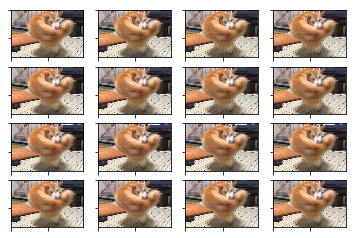

In [16]:
max_img_num = 16
imgs = []
for d in datagen.flow(x, batch_size=1):
    # このあと画像を表示するためにndarrayをPIL形式に変換して保存する
    imgs.append(keras.preprocessing.image.array_to_img(d[0], scale=True))
    # datagen.flowは無限ループするため必要な枚数取得できたらループを抜ける
    if (len(imgs) % max_img_num) == 0:
        break
show_imgs(imgs, row=4, col=4);

## 画像の回転(rotation_range)
### rotation_range=90で設定(-90度、0度、90度のどれかになる)

In [17]:
datagen_rotation = ImageDataGenerator(
           rotation_range=90,
           width_shift_range=0,
           height_shift_range=0,
           shear_range=0,
           zoom_range=0,
           horizontal_flip=False,
           vertical_flip=False)

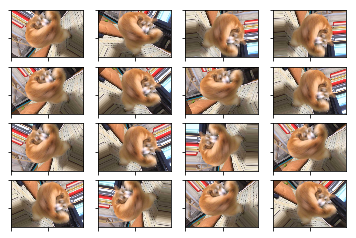

In [18]:
max_img_num = 16
imgs = []
for d in datagen_rotation.flow(x, batch_size=1):
    # このあと画像を表示するためにndarrayをPIL形式に変換して保存する
    imgs.append(keras.preprocessing.image.array_to_img(d[0], scale=True))
    # datagen.flowは無限ループするため必要な枚数取得できたらループを抜ける
    if (len(imgs) % max_img_num) == 0:
        break
show_imgs(imgs, row=4, col=4);

## 画像をシフトする
### width_shift_range=0.5で設定(画像の幅の50%の範囲でシフト)

In [19]:
datagen_shift = ImageDataGenerator(
           rotation_range=0,
           width_shift_range=0.5,
           height_shift_range=0,
           shear_range=0,
           zoom_range=0,
           horizontal_flip=False,
           vertical_flip=False)

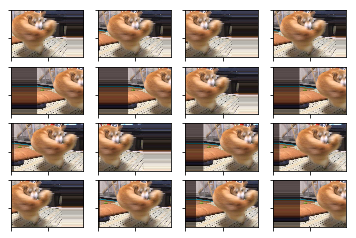

In [20]:
max_img_num = 16
imgs = []
for d in datagen_shift.flow(x, batch_size=1):
    # このあと画像を表示するためにndarrayをPIL形式に変換して保存する
    imgs.append(keras.preprocessing.image.array_to_img(d[0], scale=True))
    # datagen.flowは無限ループするため必要な枚数取得できたらループを抜ける
    if (len(imgs) % max_img_num) == 0:
        break
show_imgs(imgs, row=4, col=4);

## 画像を反転する
### horizontal_flip=Trueで設定(画像が横軸で反転する)

In [21]:
datagen_flip = ImageDataGenerator(
           rotation_range=0,
           width_shift_range=0,
           height_shift_range=0,
           shear_range=0,
           zoom_range=0,
           horizontal_flip=False,
           vertical_flip=True)

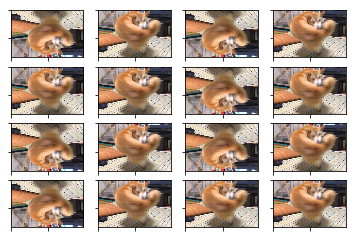

In [22]:
max_img_num = 16
imgs = []
for d in datagen_flip.flow(x, batch_size=1):
    # このあと画像を表示するためにndarrayをPIL形式に変換して保存する
    imgs.append(keras.preprocessing.image.array_to_img(d[0], scale=True))
    # datagen.flowは無限ループするため必要な枚数取得できたらループを抜ける
    if (len(imgs) % max_img_num) == 0:
        break
show_imgs(imgs, row=4, col=4);

## データ拡張を行うプログラム
- 以下のプログラムにてデータ拡張を行い、元データをrotation,shift,flipした画像を作成

```python
# 処理毎に作成する枚数
# １の場合→1枚の元画像からrotation、shift、flip　を行なった画像を1枚ずつ作成する
# 処理を行なった画像枚数 = 元画像の枚数　* 3 * n_created_image
n_created_image = 1

# 元画像が格納してあるフォルダの名前を順にclsに格納する
folder = ['cat', 'dog']

print('データ拡張開始')
for cls in folder:
    # 格納フォルダまでのフルパスを取得
    input_dir = os.path.join(os.getcwd() + "/" + cls)
    
    # 画像ファイルのフルパスを取得
    files = glob.glob(input_dir + '/*.jpg')

    # データ拡張したファイルの出力するディレクトリを指定
    # rotationした画像の格納フォルダ→dog_rotaion, cat　_rotation
    # shiftした画像の格納フォルダ→dog_shift, cat　_shift
    # flipした画像の格納フォルダ→dog_flip, cat　_flip
    output_dir_rotation = cls + "_rotation"
    output_dir_shift = cls + "_shift"
    output_dir_flip = cls + "_flip"

    for i, file in enumerate(files):

        img = load_img(file)
        x = img_to_array(img)
        x = np.expand_dims(x, axis=0)

        # それぞれの処理を行うImageDataGenaratorのインスタンスを作成
        # 処理内容→rotation、shift、flipを行った画像を1枚ずつ生成し処理毎のoutput_dirに格納
        rotation = datagen_rotation.flow(x, batch_size=1, save_to_dir=output_dir_rotation, save_prefix='img', save_format='jpg')
        shift = datagen_shift.flow(x, batch_size=1, save_to_dir=output_dir_shift, save_prefix='img', save_format='jpg')
        flip = datagen_flip.flow(x, batch_size=1, save_to_dir=output_dir_flip, save_prefix='img', save_format='jpg')

        # ImageDataGenaratorのインスタンスをリストにまとめる
        func_list = [rotation, shift, flip]
        
        # 処理を実行
        for i in range(n_created_image):
            for func in func_list:
                batch = func.next()
                
print('データ拡張終了')
```

## 学習モデルのパラメータを初期化

In [ ]:
model = Sequential()

model.add(Conv2D(32, (3, 3), padding='same',input_shape=X_train.shape[1:]))
model.add(Activation('relu'))
model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(512))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(2))
model.add(Activation('softmax'))

# コンパイル
model.compile(loss='categorical_crossentropy',optimizer='SGD',metrics=['accuracy'])

## 分類精度の確認結果
### rotationしたデータを含んだデータセット→71%
### shiftしたデータを含んだデータセット→70%
### flipしたデータを含んだデータセット→66%
### Rotation2枚　shift2枚、flip2枚、通常2枚の合計10枚のデータセット→67%

In [27]:
folder = ["cat","dog"]
image_size = 100
image_folder = '/Users/takahiro/Desktop/DiveIntoCode_session/sprint19/photo'

folder_dict = {'rotation' : ["cat_rotation", "dog_rotation"], "shift" : ["cat_shift", "dog_shift"],\
                          "flip" : ["cat_flip", "dog_flip"], "all" : ["cat_all", "dog_all"]}

for func_name, folder_name in folder_dict.items():
    X, Y = prepro(folder_name, image_size, image_folder)

    # 学習用データとテストデータ
    X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20)

    #訓練
    history = model.fit(X_train, y_train, batch_size=16,epochs=10)

    #評価 & 評価結果出力
    print('\n{}データでの分類精度'.format(func_name))
    print(model.evaluate(X_test, y_test))
    print('\n')
    
    model = Sequential()

    model.add(Conv2D(32, (3, 3), padding='same',input_shape=X_train.shape[1:]))
    model.add(Activation('relu'))
    model.add(Conv2D(32, (3, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(64, (3, 3), padding='same'))
    model.add(Activation('relu'))
    model.add(Conv2D(64, (3, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Flatten())
    model.add(Dense(512))
    model.add(Activation('relu'))
    model.add(Dropout(0.5))
    model.add(Dense(2))
    model.add(Activation('softmax'))

    # コンパイル
    model.compile(loss='categorical_crossentropy',optimizer='SGD',metrics=['accuracy'])

Epoch 1/10
16/16 [==============================] - 1s 35ms/step - loss: 0.5510 - acc: 0.7500
Epoch 2/10
16/16 [==============================] - 1s 35ms/step - loss: 0.4592 - acc: 0.6875
Epoch 3/10
16/16 [==============================] - 1s 34ms/step - loss: 0.5016 - acc: 0.8125
Epoch 4/10
16/16 [==============================] - 1s 36ms/step - loss: 0.4619 - acc: 0.8125
Epoch 5/10
16/16 [==============================] - 1s 39ms/step - loss: 0.4814 - acc: 0.8125
Epoch 6/10
16/16 [==============================] - 1s 34ms/step - loss: 0.4666 - acc: 0.7500
Epoch 7/10
16/16 [==============================] - 1s 37ms/step - loss: 0.4681 - acc: 0.8125
Epoch 8/10
16/16 [==============================] - 1s 37ms/step - loss: 0.4996 - acc: 0.7500
Epoch 9/10
16/16 [==============================] - 1s 35ms/step - loss: 0.5671 - acc: 0.6250
Epoch 10/10
16/16 [==============================] - 1s 38ms/step - loss: 0.4618 - acc: 0.8750

rotationデータでの分類精度
4/4 [==============================] - 0

# 【問題3】物体検出データセットの用意
次に、物体検出を行います。バウンディングボックスのアノテーションを行い物体検出のためのデータセットを作成してください。

## アノテーションのためのツール

アノテーションツールにはLabelImgなどがあります。

[tzutalin/labelImg: LabelImg is a graphical image annotation tool and label object bounding boxes in images](https://github.com/tzutalin/labelImg)



## 「Labellimg」を使用しアノテーションファイルを作成

## 犬の画像(dog_01.jpg)にアノテーションを実施した例

In [28]:
# カレントディレクトを画像が格納されてあるフォルダに変更
os.chdir('/Users/takahiro/Desktop/DiveIntoCode_session/sprint19')

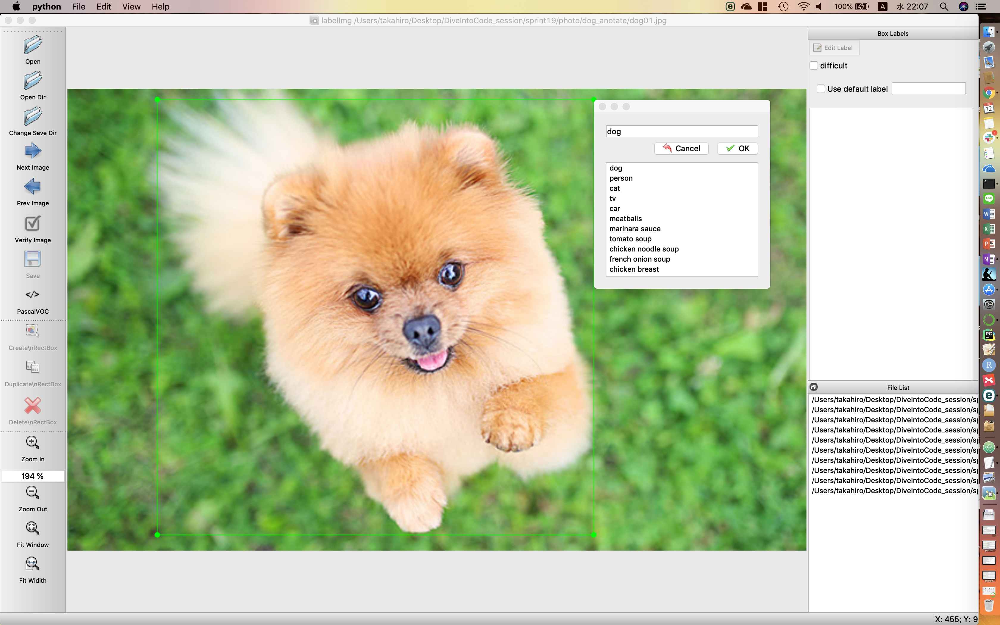

In [29]:
display(Image.open('dog_anotate.png'))

## アノテーションファイル

```python
<annotation>
	<folder>dog_anotate</folder>
	<filename>dog01.jpg</filename>
	<path>/Users/takahiro/Desktop/DiveIntoCode_session/sprint19/photo/dog_anotate/dog01.jpg</path>
	<source>
		<database>Unknown</database>
	</source>
	<size>
		<width>640</width>
		<height>400</height>
		<depth>3</depth>
	</size>
	<segmented>0</segmented>
	<object>
		<name>dog</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>77</xmin>
			<ymin>9</ymin>
			<xmax>455</xmax>
			<ymax>386</ymax>
		</bndbox>
	</object>
</annotation>
```

## 猫の画像(cat_01.jpg)にアノテーションを実施した例

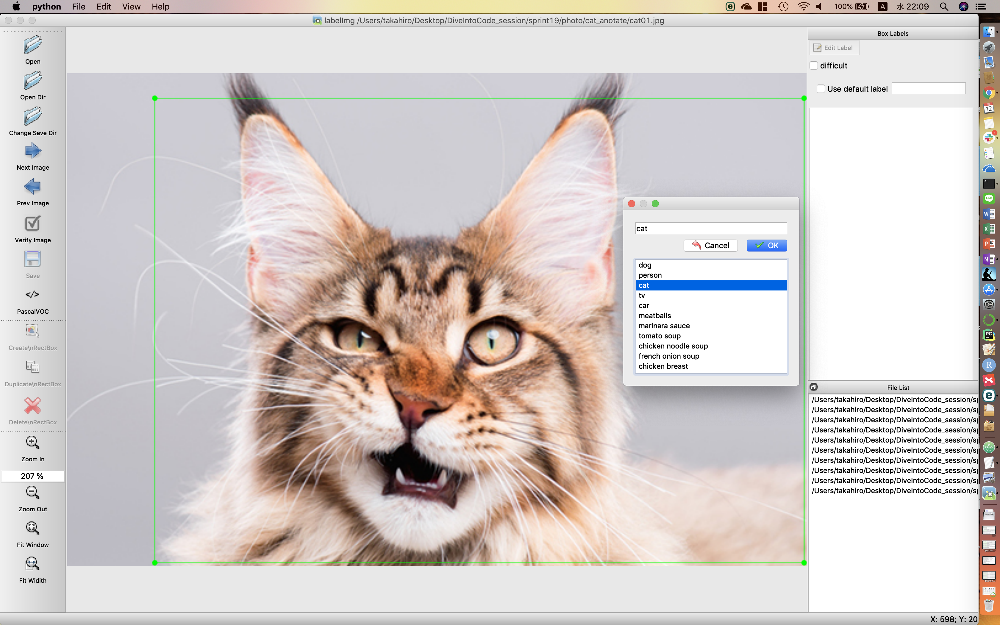

In [30]:
display(Image.open('cat_anotate.png'))

## アノテーションファイル

```python
<annotation>
	<folder>cat_anotate</folder>
	<filename>cat01.jpg</filename>
	<path>/Users/takahiro/Desktop/DiveIntoCode_session/sprint19/photo/cat_anotate/cat01.jpg</path>
	<source>
		<database>Unknown</database>
	</source>
	<size>
		<width>600</width>
		<height>400</height>
		<depth>3</depth>
	</size>
	<segmented>0</segmented>
	<object>
		<name>cat</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>71</xmin>
			<ymin>20</ymin>
			<xmax>598</xmax>
			<ymax>397</ymax>
		</bndbox>
	</object>
</annotation>
```

# 【問題4】物体検出データセットに対するデータ拡張
データ拡張（Data Augmentation）を行ってください。前述のalbumentationsはバウンディングボックスを合わせての加工が可能です。詳細はREADME.mdを確認してください。

物体検出の学習を行なうかどうかは任意とします。

In [31]:
%matplotlib inline
from urllib.request import urlopen
import os

import numpy as np
import cv2
from matplotlib import pyplot as plt

from albumentations import (
    HorizontalFlip,
    VerticalFlip,
    Resize,
    CenterCrop,
    RandomCrop,
    Crop,
    Compose,
    CenterCrop
)

In [32]:
BOX_COLOR = (255, 0, 0)
TEXT_COLOR = (255, 255, 255)

def visualize_bbox(img, bbox, class_id, class_idx_to_name, color=BOX_COLOR, thickness=2):
    x_min, y_min, w, h = bbox
    x_min, x_max, y_min, y_max = int(x_min), int(x_min + w), int(y_min), int(y_min + h)
    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)
    class_name = class_idx_to_name[class_id]
    ((text_width, text_height), _) = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 0.35, 1)    
    cv2.rectangle(img, (x_min, y_min - int(1.3 * text_height)), (x_min + text_width, y_min), BOX_COLOR, -1)
    cv2.putText(img, class_name, (x_min, y_min - int(0.3 * text_height)), cv2.FONT_HERSHEY_SIMPLEX, 0.35,TEXT_COLOR, lineType=cv2.LINE_AA)
    return img


def visualize(annotations, category_id_to_name):
    img = annotations['image'].copy()
    for idx, bbox in enumerate(annotations['bboxes']):
        img = visualize_bbox(img, bbox, annotations['category_id'][idx], category_id_to_name)
    plt.figure(figsize=(12, 12))
    plt.imshow(img)

    
def get_aug(aug, min_area=0., min_visibility=0.):
    return Compose(aug, bbox_params={'format': 'coco', 'min_area': min_area, 'min_visibility': min_visibility, 'label_fields': ['category_id']})

## 元画像

In [34]:
image = Image.open('/Users/takahiro/Desktop/DiveIntoCode_session/sprint19/photo/dog_anotate/dog01.jpg')
image = image.convert("RGB")

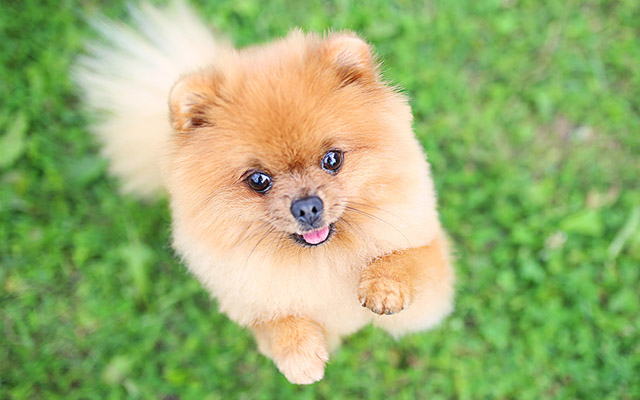

In [35]:
image

## バウンディングボックスの座標を取得

In [38]:
import xml.etree.ElementTree as ET
 
tree = ET.parse('/Users/takahiro/Desktop/DiveIntoCode_session/sprint19/photo/dog_anotate/dog01.xml')
root = tree.getroot()

In [39]:
bboxes = []
li = []
for i in range(4):
    li.append(int(root[6][4][i].text))
bboxes.append(li)

In [40]:
bboxes

[[77, 9, 455, 386]]

In [41]:
annotations = {'image': image, 'bboxes': bboxes, 'category_id': [1]}
category_id_to_name = {1: 'dog'}

## 元画像

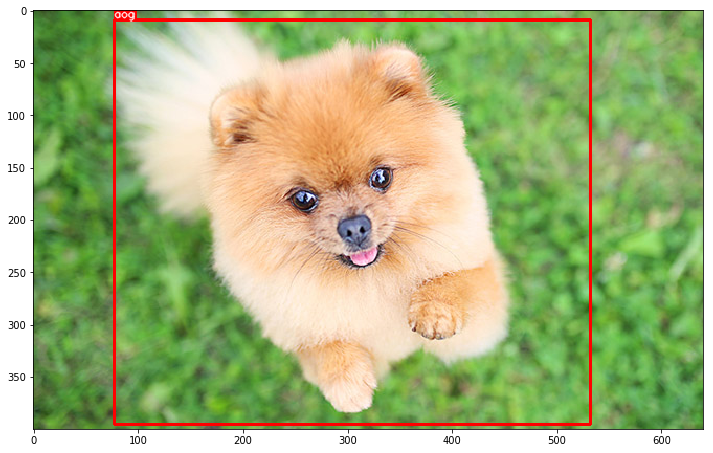

In [42]:
visualize(annotations, category_id_to_name)

## VerticalFlip

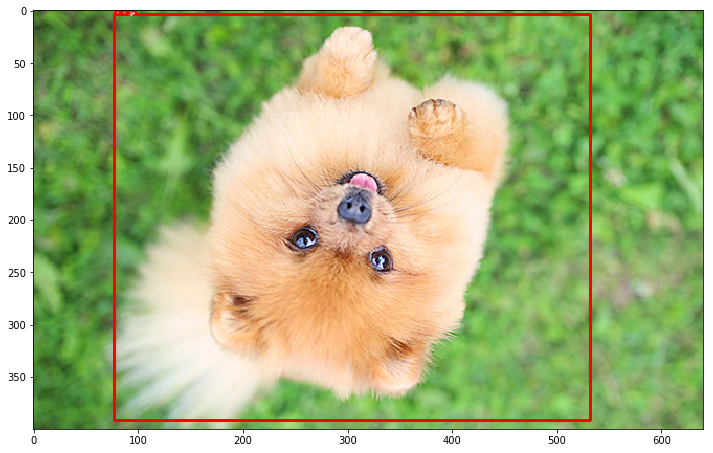

In [43]:
aug = get_aug([VerticalFlip(p=1)])
augmented = aug(**annotations)
visualize(augmented, category_id_to_name)

## HorizontalFlip

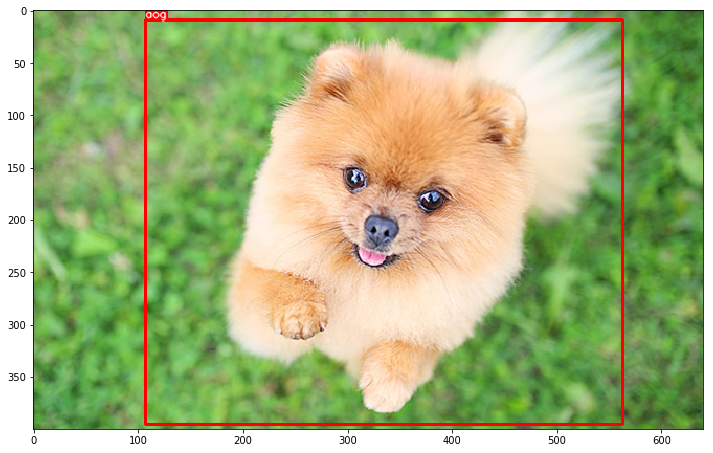

In [44]:
aug = get_aug([HorizontalFlip(p=1)])
augmented = aug(**annotations)
visualize(augmented, category_id_to_name)

## Resize

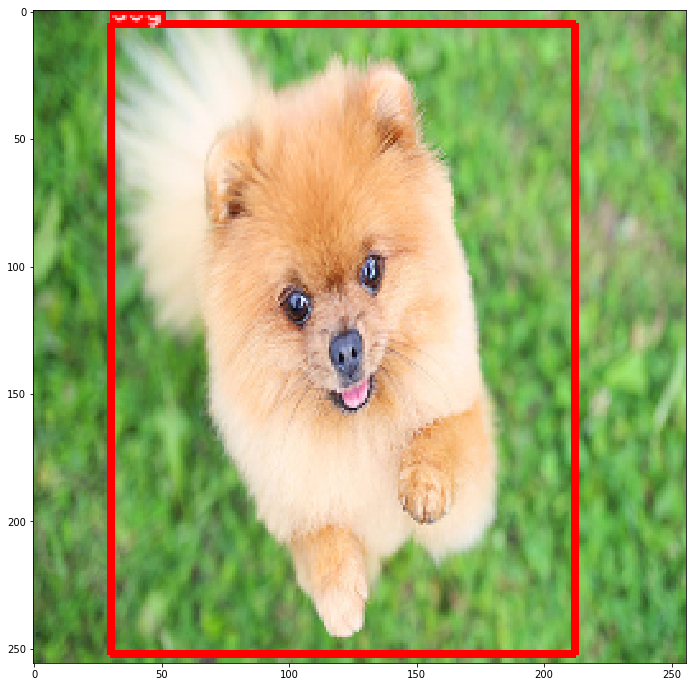

In [45]:
aug = get_aug([Resize(p=1, height=256, width=256)])
augmented = aug(**annotations)
visualize(augmented, category_id_to_name)

## CenterCrop

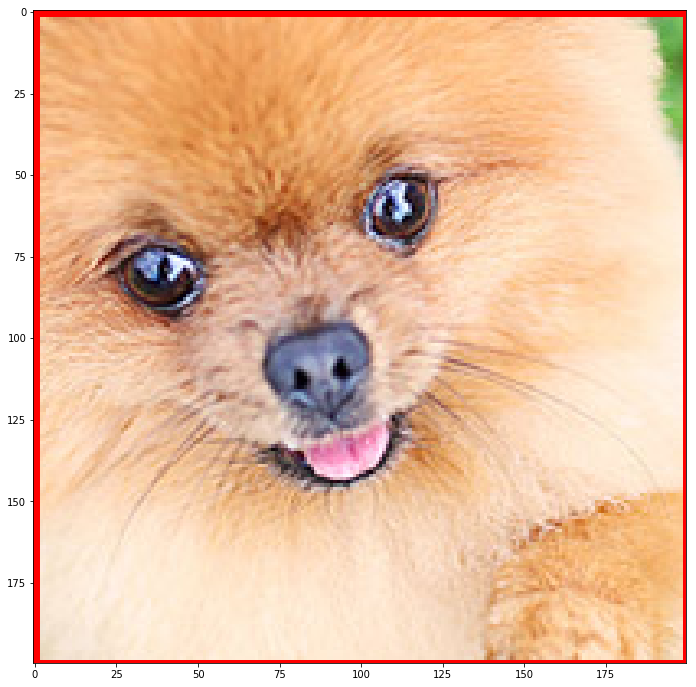

In [46]:
aug = get_aug([CenterCrop(height=200, width=200, p=1)])
augmented = aug(**annotations)
visualize(augmented, category_id_to_name)